In [1]:
import pandas as pd

import plotly.express as px
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt


from tqdm.notebook import tqdm
tqdm.pandas()
pd.options.display.max_columns = 999

import plotly.graph_objects as go
import ipyvuetify as v

from ipywidgets import interact, Checkbox, Select, Output, widgets
import ipywidgets
from datetime import datetime

from IPython.display import display


import continental_level_plots
import country_level_plots
import flight_level_plots
import time

In [2]:
#### Import various plot file. In case the source file is modified, please rerun preprocess.py ####

# import preprocess
# preprocess.preprocess()

In [3]:

#read continental level data
continental_flows=pd.read_csv('./plot_files/continental_flows.csv',sep=',', keep_default_na=False, na_values=['', 'NaN'], index_col=0)
continental_flows_non_dir=pd.read_csv('./plot_files/continental_flows_non_dir.csv',sep=',', keep_default_na=False, na_values=['', 'NaN'], index_col=0)
conti_scatter=pd.read_csv('./plot_files/conti_scatter.csv',sep=',', keep_default_na=False, na_values=['', 'NaN'], index_col=0)
flights_df_conti=pd.read_csv('./plot_files/flights_df_conti.zip',compression='zip',sep=',', keep_default_na=False, na_values=['', 'NaN'], index_col=0)

#read country level data
country_flows=pd.read_csv('./plot_files/country_flows.csv',sep=',', keep_default_na=False, na_values=['', 'NaN'], index_col=0)
country_fixed=pd.read_csv('./plot_files/country_fixed.csv',sep=',', keep_default_na=False, na_values=['', 'NaN'], index_col=0)
country_fixed_sep_dom=pd.read_csv('./plot_files/country_fixed_sep_dom.csv',sep=',', keep_default_na=False, na_values=['', 'NaN'], index_col=0)

#read flight_level_data
flights_df=pd.read_csv('./plot_files/flights_df.zip',compression='zip', sep=',',keep_default_na=False, na_values=['', 'NaN'], index_col=0)

In [4]:
##### DEV ZONE ######
world_bank_data= pd.read_csv('data/world_bank_data.csv', sep=';')
countries_fixed_test = country_fixed.merge(world_bank_data, left_on='departure_ISO3', right_on='Country Code', how='left').drop(columns={'Country Name','Country Code'})
countries_fixed_test = countries_fixed_test.dropna(subset=['GDP PPP','toursim_export_share','population'])

countries_fixed_sep_dom_test = country_fixed_sep_dom.merge(world_bank_data, left_on='departure_ISO3', right_on='Country Code', how='left').drop(columns={'Country Name','Country Code'})
countries_fixed_sep_dom_test = countries_fixed_sep_dom_test.dropna(subset=['GDP PPP','Surf','toursim_export_share','population'])


In [5]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    median_absolute_error,
    mean_absolute_percentage_error,
    r2_score,
)


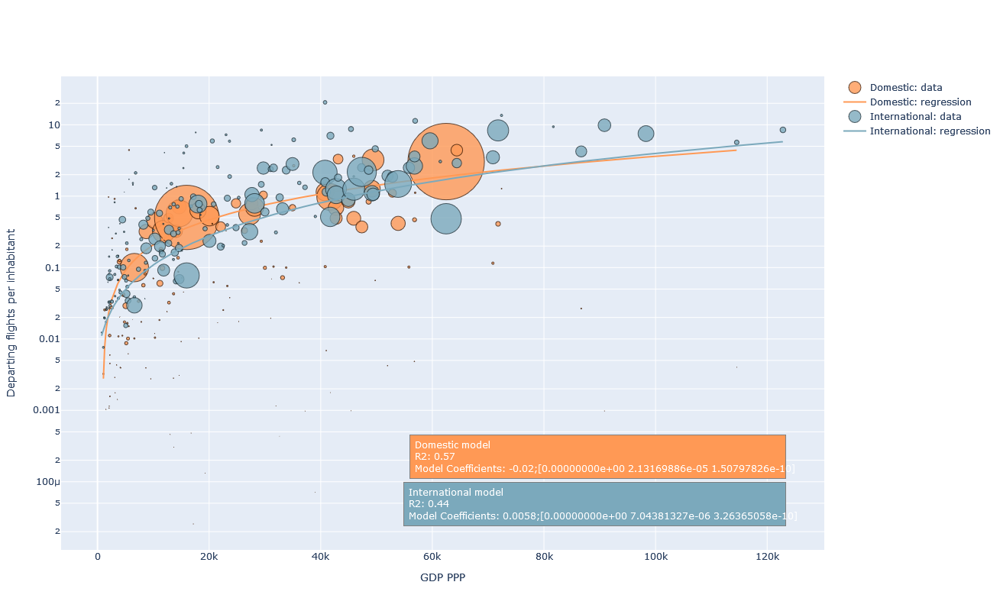

In [6]:
### Polynomial regression


country_dom=countries_fixed_sep_dom_test[countries_fixed_sep_dom_test['domestic']==1 ].copy()
country_dom=country_dom[country_dom['seats']/country_dom['population']>0.00]


X = country_dom[['GDP PPP']].copy()
y = (country_dom['seats']/country_dom['population'])

##### Polynomial #####
w=country_dom['population']


# # Create polynomial features
poly_features = PolynomialFeatures(degree=2)
X_poly = poly_features.fit_transform(X)

# # Fit the polynomial regression model
model = LinearRegression()
model.fit(X_poly, y, sample_weight=w)

# Generate predictions
y_pred = model.predict(X_poly)



df_viz = pd.concat([X,country_dom[['departure_country_name', 'population', 'seats']], y], axis=1).rename(columns={0:'y'})
df_viz['y_pred']=y_pred


df_viz=df_viz.sort_values(by='GDP PPP')

fig = go.Figure()

# Add a scatter plot
fig.add_trace(go.Scatter(
    x=df_viz['GDP PPP'],
    y=df_viz['y'],
    mode='markers',
    marker=dict(
        size=0.000005*df_viz['seats'],
        opacity=0.8 , # Set the marker opacity,
        color='rgb(255, 153, 85)',
        sizemode='area',
        line=dict(color='#3D1800')
    ),
    text=df_viz['departure_country_name'],
    name='Domestic: data'
))
# fig= go.Figure()



fig.add_trace(go.Scatter(
    y=df_viz['y_pred'].values,
    x=df_viz['GDP PPP'].values,
    opacity=1,
    line=dict(color='rgb(255, 153, 85)'),
    name='Domestic: regression'
))


r2 = r2_score(y, y_pred, sample_weight=w)


fig.add_annotation(
    text=f'Domestic model<br>R2: {r2:.2f}<br>Model Coefficients: {model.intercept_:.2};{model.coef_}',
    showarrow=False,
    xref='paper',
    yref='paper',
    x=0.95,
    y=0.15,
    font=dict(size=12, color='white'),  # Text style
    align='left',
    bgcolor='rgb(255, 153, 85, 0.25)',  # Box background color
    bordercolor='gray',  # Box border color
    borderwidth=1,  # Box border width
    borderpad=4,
)

##################### DOMESTIC #########################################
country_int=countries_fixed_sep_dom_test[countries_fixed_sep_dom_test['domestic']==0].copy()
country_int=country_int[country_int['seats']/country_int['population']>0.00]


### Polynomial regression

X = country_int[['GDP PPP']].copy()
y = (country_int['seats']/country_int['population'])

##### Polynomial #####
w=country_int['population']


# # Create polynomial features
poly_features = PolynomialFeatures(degree=2)
X_poly = poly_features.fit_transform(X)

# # Fit the polynomial regression model
model = LinearRegression()
model.fit(X_poly, y, sample_weight=w)

# Generate predictions
y_pred = model.predict(X_poly)



df_viz = pd.concat([X,country_int[['departure_country_name', 'population', 'seats']], y], axis=1).rename(columns={0:'y'})
df_viz['y_pred']=y_pred


df_viz=df_viz.sort_values(by='GDP PPP')


# Add a scatter plot
fig.add_trace(go.Scatter(
    x=df_viz['GDP PPP'],
    y=df_viz['y'],
    mode='markers',
    marker=dict(
        size=0.000005*df_viz['seats'],
        opacity=0.8 , # Set the marker opacity,
        sizemode='area',
        color='rgb(123, 169, 188)', 
        line=dict(color='#1B2E36')
    ),
    text=df_viz['departure_country_name'],
    name='International: data'
))
# fig= go.Figure()



fig.add_trace(go.Scatter(
    y=df_viz['y_pred'].values,
    x=df_viz['GDP PPP'].values,
    opacity=1,
    line=dict(color='rgb(123, 169, 188)'),
    name='International: regression'
))


fig.update_layout(
    height=800,
        xaxis_title='GDP PPP',
        yaxis_title='Departing flights per inhabitant',
        yaxis_type='log',
        # yaxis=dict(range=[1, None])
    
)

r2 = r2_score(y, y_pred, sample_weight=w)

fig.add_annotation(
    text=f'International model<br>R2: {r2:.2f}<br>Model Coefficients: {model.intercept_:.2};{model.coef_}',
    showarrow=False,
    xref='paper',
    yref='paper',
    x=0.95,
    y=0.05,
    font=dict(size=12, color='white'),  # Text style
    align='left',
    bgcolor='rgb(123, 169, 188, 0.25)',  # Box background color
    bordercolor='gray',  # Box border color
    borderwidth=1,  # Box border width
    borderpad=4,
)

fig

0.8428082463976183
[0.00000000e+00 3.01318595e-05 4.44481630e-10]


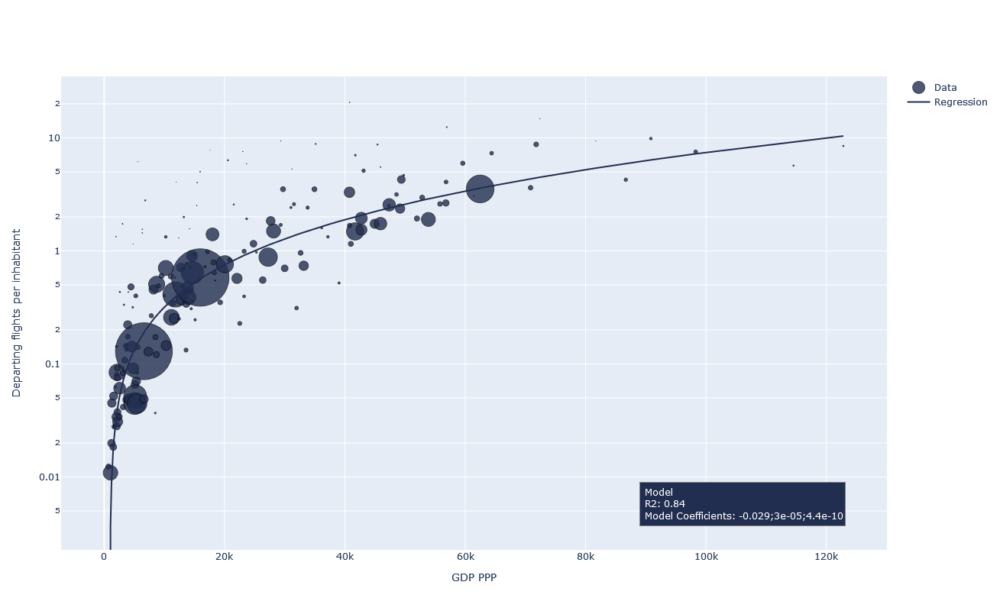

In [7]:
### Polynomial regression

X = countries_fixed_test[['GDP PPP']].copy()
y = (countries_fixed_test['seats']/countries_fixed_test['population'])

##### Polynomial #####
w=countries_fixed_test['population']


# # Create polynomial features
poly_features = PolynomialFeatures(degree=2)
X_poly = poly_features.fit_transform(X)

# # Fit the polynomial regression model
model = LinearRegression()
model.fit(X_poly, y, sample_weight=w)

# Generate predictions
y_pred = model.predict(X_poly)



df_viz = pd.concat([X,countries_fixed_test[['departure_country_name', 'population']], y], axis=1).rename(columns={0:'y'})
df_viz['y_pred']=y_pred


df_viz=df_viz.sort_values(by='GDP PPP')

fig = go.Figure()

# Add a scatter plot
fig.add_trace(go.Scatter(
    x=df_viz['GDP PPP'],
    y=df_viz['y'],
    mode='markers',
    marker=dict(
        size=0.000002*df_viz['population'],
        opacity=0.8 , # Set the marker opacity,
        sizemode='area', 
        color="#222E50",
        line=dict(color='#0c111d'),
    ),
    text=df_viz['departure_country_name'],
    name='Data'
))
# fig= go.Figure()



fig.add_trace(go.Scatter(
    y=df_viz['y_pred'].values,
    x=df_viz['GDP PPP'].values,
    opacity=1,
    line=dict(color='#222E50'),
    name='Regression'
))


fig.update_layout(
    height=800,
        xaxis_title='GDP PPP',
        yaxis_title='Departing flights per inhabitant',
        yaxis_type='log'
    
)

r2 = r2_score(y, y_pred, sample_weight=w)

fig.add_annotation(
    text=f'Model<br>R2: {r2:.2f}<br>Model Coefficients: {model.intercept_:.2};{model.coef_[1]:.2};{model.coef_[2]:.2}',
    showarrow=False,
    xref='paper',
    yref='paper',
    x=0.95,
    y=0.05,
    font=dict(size=12, color='white'),  # Text style
    align='left',
    bgcolor='rgb(34, 46, 80, 0.25)',  # Box background color
    bordercolor='gray',  # Box border color
    borderwidth=1,  # Box border width
    borderpad=4,
)


r2 = r2_score(y, y_pred, sample_weight=w)
print(r2)
print(model.coef_)
fig

In [8]:
country_int

,departure_country,departure_country_name,departure_ISO3,domestic,seats,ask,fuel_burn,co2,CO2 (Mt),ASK (Bn),Seats (Mn),departure_lat,departure_lon,GDP PPP,Gini,Surf,toursim_export_share,visiting_tourists,outbound_tourists,population,Notes
0,AE,United Arab Emirates,ARE,0,7.683864e+07,3.088751e+11,7.761569e+09,2.452656e+10,24.526558,308.875095,76.838644,24.0000,54.0000,71782.153840,26.0,71020.0,9.500000,25282000.0,1.890600e+07,9211657.0,manual tourism export share
2,AF,"Afghanistan, Islamic Republic of",AFG,0,1.238705e+06,2.621234e+09,6.428162e+07,2.031299e+08,0.203130,2.621234,1.238705,33.0000,65.0000,2079.921861,NaN,652230.0,5.607753,NaN,NaN,37769499.0,NaN
4,AG,Antigua and Barbuda,ATG,0,6.678227e+05,1.747643e+09,4.362845e+07,1.378659e+08,0.137866,1.747643,0.667823,17.0500,-61.8000,23035.657980,NaN,440.0,82.963846,1035000.0,NaN,92117.0,NaN
7,AL,"Albania, Republic of",ALB,0,2.203174e+06,2.042768e+09,5.422994e+07,1.713666e+08,0.171367,2.042768,2.203174,41.0000,20.0000,13653.226770,29.4,27400.0,50.970623,6406000.0,5.922000e+06,2854191.0,NaN
9,AM,"Armenia, Republic of",ARM,0,2.018229e+06,3.429540e+09,7.747444e+07,2.448192e+08,0.244819,3.429540,2.018229,40.0000,45.0000,14317.552870,27.9,28470.0,26.801621,1894000.0,1.868000e+06,2820602.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
394,VN,"Vietnam, Socialist Republic of",VNM,0,2.414248e+07,6.040935e+10,1.426023e+09,4.506232e+09,4.506232,60.409346,24.142484,16.0000,106.0000,10252.004620,36.8,313429.0,4.212573,18009000.0,NaN,95776716.0,NaN
396,VU,"Vanuatu, Republic of",VUT,0,2.497571e+05,4.591315e+08,1.098186e+07,3.470268e+07,0.034703,0.459132,0.249757,-16.0000,167.0000,3070.350828,32.3,12190.0,79.149881,256000.0,3.640000e+04,304404.0,NaN
400,WS,"Samoa, Independent State of",WSM,0,3.240849e+05,8.095097e+08,1.879094e+07,5.937937e+07,0.059379,0.809510,0.324085,-13.5833,-172.3333,6346.146335,38.7,2780.0,61.196935,181000.0,6.900000e+04,211905.0,NaN
406,ZA,"South Africa, Republic of",ZAF,0,9.450325e+06,5.293284e+10,1.372514e+09,4.337144e+09,4.337144,52.932841,9.450325,-29.0000,24.0000,13852.205970,63.0,1213090.0,8.551908,14797000.0,NaN,58087055.0,NaN


0.871916259847995
[ 0.00000000e+00  2.28794066e-05  1.75890912e-02  4.14210672e-10
  1.09746977e-06 -3.52124591e-04]


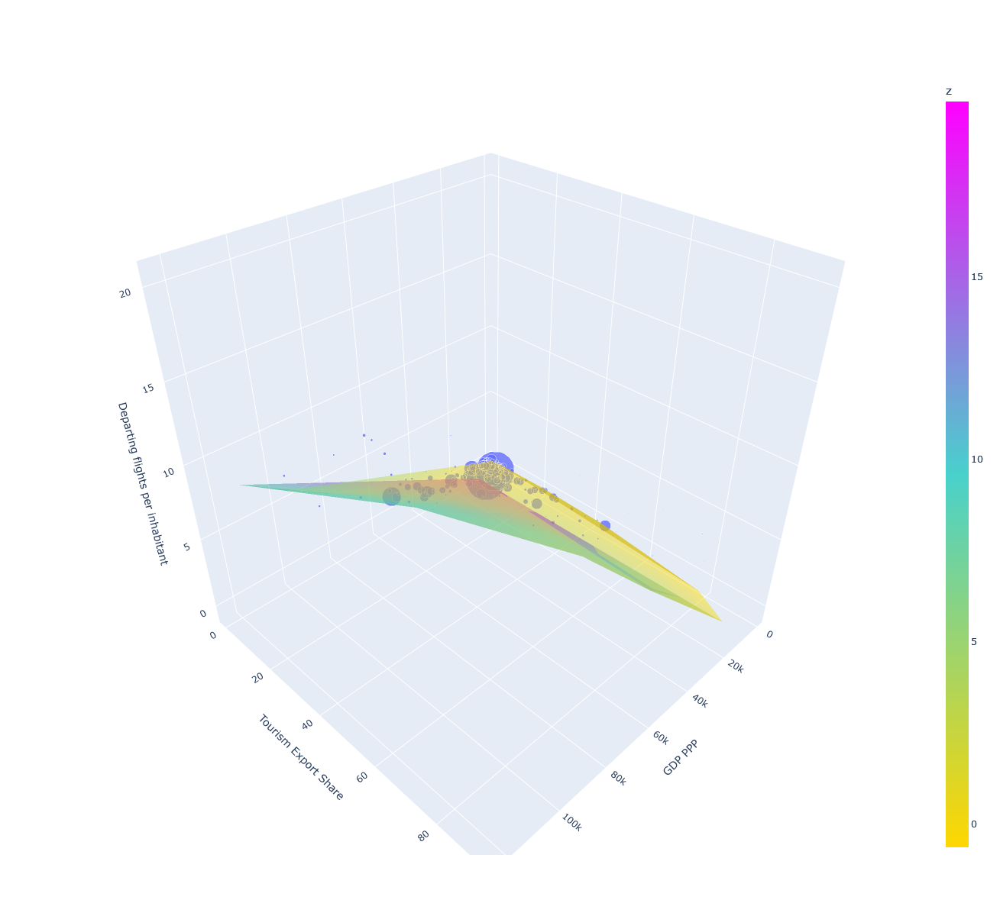

In [9]:
### Multipolynomial regression by adding the toursim export share
# ==> very limited improvement of the fit



X = countries_fixed_test[['GDP PPP', 'toursim_export_share']].copy()
y = (countries_fixed_test['seats']/countries_fixed_test['population'])

##### Polynomial #####
w=countries_fixed_test['population']


# # Create polynomial features
poly_features = PolynomialFeatures(degree=2)
X_poly = poly_features.fit_transform(X)

# # Fit the polynomial regression model
model = LinearRegression()
model.fit(X_poly, y, sample_weight=w)

# Generate predictions
y_pred = model.predict(X_poly)



df_viz = pd.concat([X,countries_fixed_test[['departure_country_name', 'population']], y], axis=1).rename(columns={0:'y'})
df_viz['y_pred']=y_pred


df_viz=df_viz.sort_values(by='GDP PPP')

fig = go.Figure()

# Add a scatter plot
fig.add_trace(go.Scatter3d(
    x=df_viz['GDP PPP'],
    y=df_viz['toursim_export_share'],
    z=df_viz['y'],
    mode='markers',
    marker=dict(
        size=0.000005*df_viz['population'],
        opacity=0.8,  # Set the marker opacity
        sizemode='area',
    ),
    text=df_viz['departure_country_name'],
))
# fig= go.Figure()



fig.add_trace(go.Mesh3d(
    z=df_viz['y_pred'].values,
    intensity=df_viz['y_pred'].values,
    x=df_viz['GDP PPP'].values,
    y=df_viz['toursim_export_share'].values,
    opacity=0.5,
    colorbar_title='z',
        colorscale=[[0, 'gold'],
                    [0.5, 'mediumturquoise'],
                    [1, 'magenta']],
    
    # log_y=True, 
    # mode='lines',
))


fig.update_layout(
    height=1200,
    scene=dict(
        xaxis_title='GDP PPP',
        yaxis_title='Tourism Export Share',
        zaxis_title='Departing flights per inhabitant',
        # zaxis_type='log'
    )
)


r2 = r2_score(y, y_pred, sample_weight=w)
print(r2)
print(model.coef_)
fig

### Clustering countries

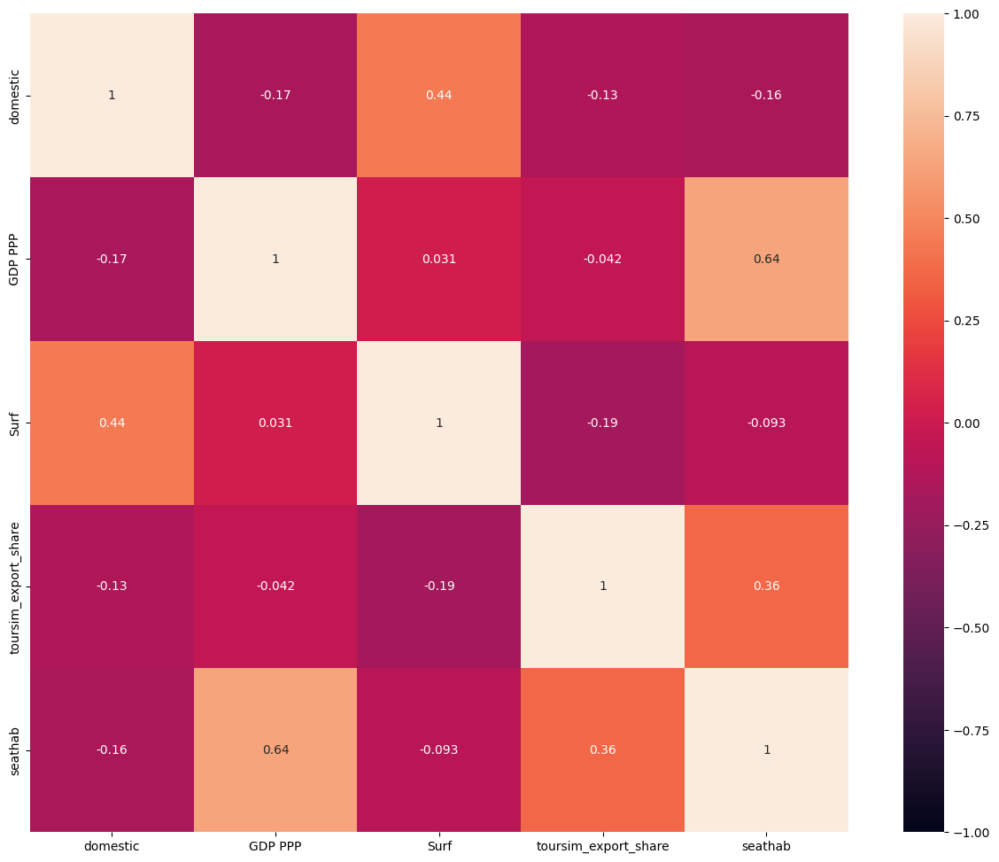

In [10]:
df = countries_fixed_test.copy()

# df= df[df.domestic==1]

df['seathab']=df['seats']/df['population']



df_heat = df.drop(columns=["departure_country","departure_country_name","departure_ISO3",'departure_lon','departure_lat', 'CO2 (Mt)', 'ASK (Bn)', 'Seats (Mn)','Gini', 'visiting_tourists',
                           'outbound_tourists', 'seats', 'ask', 'co2','fuel_burn','Notes', 'population'])
fig, ax = plt.subplots(figsize=(16,12))
ax = sns.heatmap(df_heat.corr(), annot=True, ax=ax, square=True, vmin=-1, vmax=1)

In [11]:
df.isna().sum()

departure_country           0
departure_country_name      0
departure_ISO3              0
seats                       0
ask                         0
fuel_burn                   0
co2                         0
CO2 (Mt)                    0
ASK (Bn)                    0
Seats (Mn)                  0
domestic                    0
departure_lat               1
departure_lon               1
GDP PPP                     0
Gini                       32
Surf                        0
toursim_export_share        0
visiting_tourists           3
outbound_tourists          68
population                  0
Notes                     174
seathab                     0
dtype: int64

In [12]:
## Scaling data for KNN
column = (df_heat.columns).to_list()
# column = column[]


from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
data_train = df_heat[column]
data_train[column] = scaler.fit_transform(data_train)

data_train=data_train.dropna()

In [13]:
data_train

,domestic,GDP PPP,Surf,toursim_export_share,seathab
0,0.212720,0.581956,0.004335,0.101918,0.424204
1,0.081691,0.011059,0.039825,0.059985,0.001116
2,0.029380,0.182698,0.000026,0.893380,0.367247
4,0.016540,0.105851,0.001672,0.548702,0.036952
5,0.000000,0.111292,0.001737,0.288317,0.034200
...,...,...,...,...,...
224,0.392867,0.077993,0.019137,0.044954,0.033726
225,0.949614,0.019171,0.000743,0.852291,0.083774
227,0.148858,0.046002,0.000169,0.658875,0.074611
231,0.384979,0.107480,0.074072,0.091704,0.022622


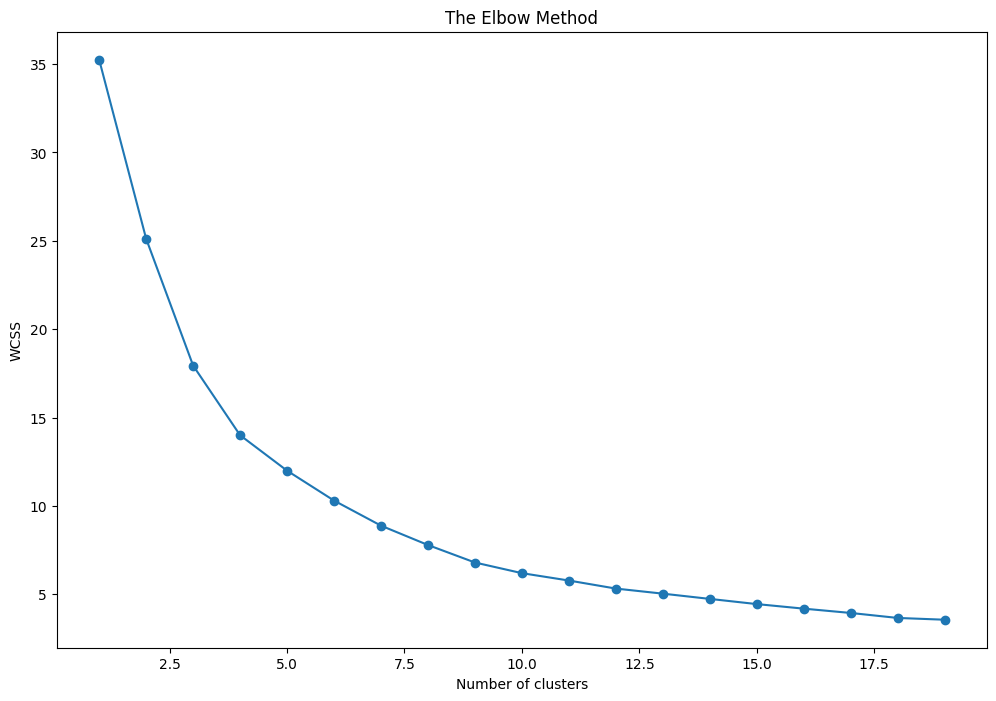

In [14]:
from sklearn.cluster import KMeans

wcss=[]
for i in range(1, 20):
    kmeans = KMeans(n_clusters = i,n_init=50,  random_state = 40)
    kmeans.fit(data_train)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(12,8))
plt.plot(range(1, 20), wcss)
plt.scatter(range(1, 20), wcss)

plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [64]:

kmeans = KMeans(n_clusters=5, init='k-means++').fit(data_train)
labels = kmeans.labels_

country_data_with_label = df_heat.copy().dropna()
country_data_with_label["cluster"] = labels

data_clustering = data_train.copy()
data_clustering['country'] = df["departure_country"]
data_clustering['country_iso'] = df["departure_ISO3"]
data_clustering["cluster"] = labels



cluster_map = {
    0 : "A", 
    1 : "B", 
    2 : "C",
    3 : 'D',
    4 : 'E',
    5:'F',
    6:'G',
    # 7:'H',
}

data_clustering = data_clustering.replace({"cluster" : cluster_map})



C:\Users\a.salgas.ISAE-SUPAERO\AppData\Local\miniconda3\envs\aeroscope\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [65]:
print(sns.color_palette().as_hex())

['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']


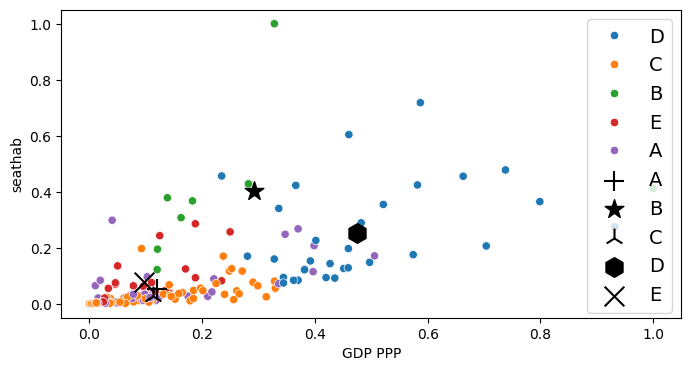

In [66]:
plt.figure(figsize=(8,4))
scat = sns.scatterplot(data=data_clustering, x="GDP PPP", y="seathab", hue="cluster")
# plt.suptitle('Clustering', y=0.95, weight="bold", fontsize=20)
# plt.title("aa", weight='light')

centers = kmeans.cluster_centers_
plt.scatter(centers[0,1], centers[0, 4],  s = 200, label='A', color='black', marker='+')
plt.scatter(centers[1,1], centers[1, 4],  s = 200, label='B', color='black', marker='*')
plt.scatter(centers[2,1], centers[2, 4],  s = 200, label='C', color='black', marker='2')
plt.scatter(centers[3,1], centers[3, 4],  s = 200, label='D', color='black', marker='h')
plt.scatter(centers[4,1], centers[4, 4],  s = 200, label='E', color='black', marker= 'x')
# plt.scatter(centers[5,1], centers[5, 4],  s = 200, label='F', color='black', marker='d')
# plt.scatter(centers[6,1], centers[6, 4],  s = 200, label='G', color='black', marker='P')
# plt.scatter(centers[7,1], centers[7, 4],  s = 200, label='H', color='black', marker= 'o')

scat.legend(fontsize=14)
plt.show()

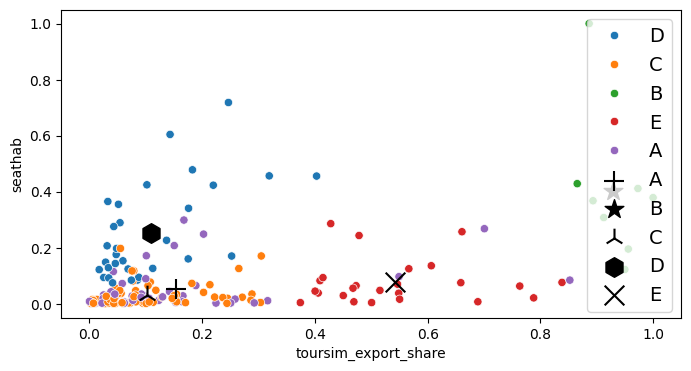

In [67]:
plt.figure(figsize=(8,4))
scat = sns.scatterplot(data=data_clustering, x="toursim_export_share", y="seathab", hue="cluster")
# plt.suptitle('Clustering', y=0.95, weight="bold", fontsize=20)
# plt.title("the lower the gdpp, the lower rate of life expectations", weight='light')

centers = kmeans.cluster_centers_
plt.scatter(centers[0,3], centers[0, 4],  s = 200, label='A', color='black', marker='+')
plt.scatter(centers[1,3], centers[1, 4],  s = 200, label='B', color='black', marker='*')
plt.scatter(centers[2,3], centers[2, 4],  s = 200, label='C', color='black', marker='2')
plt.scatter(centers[3,3], centers[3, 4],  s = 200, label='D', color='black', marker='h')
plt.scatter(centers[4,3], centers[4, 4],  s = 200, label='E', color='black', marker= 'x')
# plt.scatter(centers[5,3], centers[5, 4],  s = 200, label='F', color='black', marker='d')
# plt.scatter(centers[6,3], centers[6, 4],  s = 200, label='G', color='black', marker='P')
# plt.scatter(centers[7,3], centers[7, 4],  s = 200, label='H', color='black', marker= 'o')
scat.legend(fontsize=14)
plt.show()



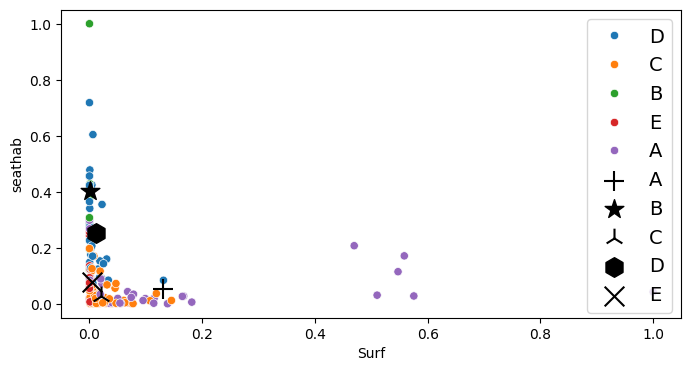

In [68]:
plt.figure(figsize=(8,4))
scat = sns.scatterplot(data=data_clustering, x="Surf", y="seathab", hue="cluster")
# plt.suptitle('Clustering', y=0.95, weight="bold", fontsize=20)
# plt.title("the lower the gdpp, the lower rate of life expectations", weight='light')

centers = kmeans.cluster_centers_
plt.scatter(centers[0,2], centers[0, 4],  s = 200, label='A', color='black', marker='+')
plt.scatter(centers[1,2], centers[1, 4],  s = 200, label='B', color='black', marker='*')
plt.scatter(centers[2,2], centers[2, 4],  s = 200, label='C', color='black', marker='2')
plt.scatter(centers[3,2], centers[3, 4],  s = 200, label='D', color='black', marker='h')
plt.scatter(centers[4,2], centers[4, 4],  s = 200, label='E', color='black', marker= 'x')
# plt.scatter(centers[5,2], centers[5, 4],  s = 200, label='F', color='black', marker='d')
# plt.scatter(centers[6,2], centers[6, 4],  s = 200, label='G', color='black', marker='P')
# plt.scatter(centers[7,2], centers[7, 4],  s = 200, label='H', color='black', marker= 'o')

scat.legend(fontsize=14)
plt.show()

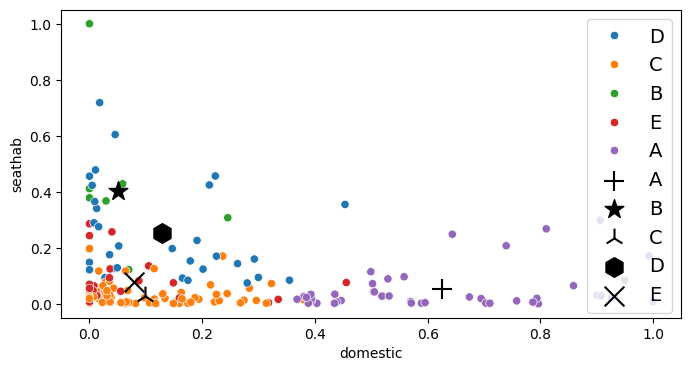

In [69]:
plt.figure(figsize=(8,4))
scat = sns.scatterplot(data=data_clustering, x="domestic", y="seathab", hue="cluster")
# plt.suptitle('Clustering', y=0.95, weight="bold", fontsize=20)
# plt.title("the lower the gdpp, the lower rate of life expectations", weight='light')

centers = kmeans.cluster_centers_
plt.scatter(centers[0,0], centers[0, 4],  s = 200, label='A', color='black', marker='+')
plt.scatter(centers[1,0], centers[1, 4],  s = 200, label='B', color='black', marker='*')
plt.scatter(centers[2,0], centers[2, 4],  s = 200, label='C', color='black', marker='2')
plt.scatter(centers[3,0], centers[3, 4],  s = 200, label='D', color='black', marker='h')
plt.scatter(centers[4,0], centers[4, 4],  s = 200, label='E', color='black', marker= 'x')
# plt.scatter(centers[5,0], centers[5, 4],  s = 200, label='F', color='black', marker='d')
# plt.scatter(centers[6,0], centers[6, 4],  s = 200, label='G', color='black', marker='P')
# plt.scatter(centers[7,0], centers[7, 4],  s = 200, label='H', color='black', marker= 'o')

scat.legend(fontsize=14)
plt.show()

Text(0.5, 0, '')

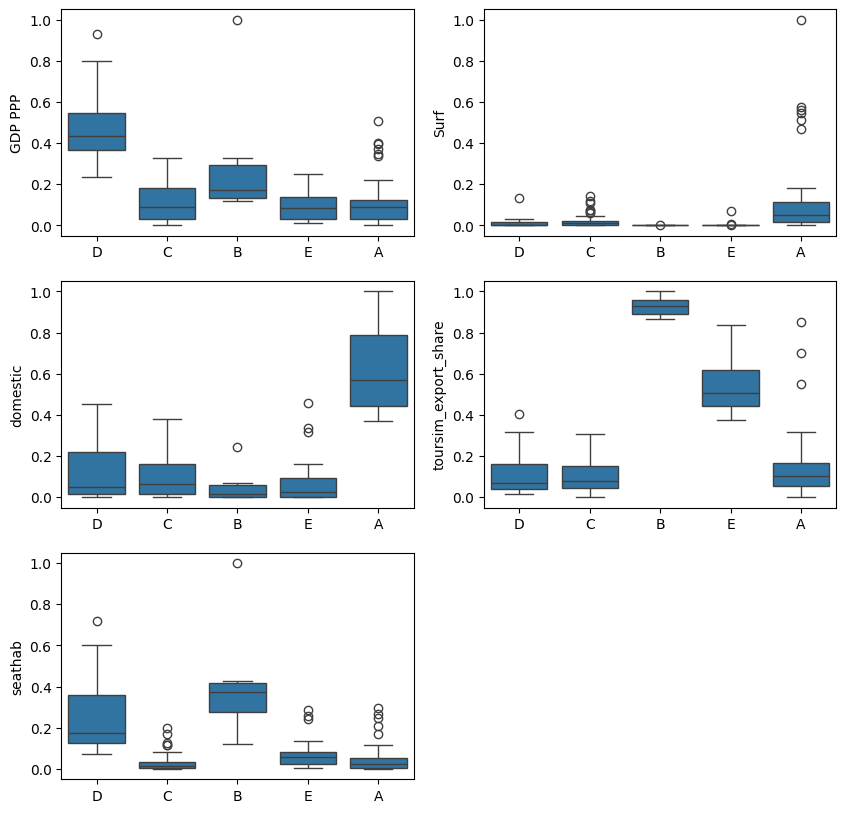

In [70]:
fig = plt.figure(figsize=(10,10))
child_mort = fig.add_subplot(3,2,1) # or fig.add_subplot(xyz)
exports = fig.add_subplot(3,2,2)
health = fig.add_subplot(3,2,3)
imports = fig.add_subplot(3,2,4)
income = fig.add_subplot(3,2,5)


#subplot 1
sns.boxplot(x='cluster', y='GDP PPP', data=data_clustering, ax=child_mort)
child_mort.set_xlabel('')

#subplot 2
sns.boxplot(x='cluster', y='Surf', data=data_clustering, ax=exports)
exports.set_xlabel('')

#subplot 3
sns.boxplot(x='cluster', y='domestic', data=data_clustering, ax=health)
health.set_xlabel('')

#subplot 4
sns.boxplot(x='cluster', y='toursim_export_share', data=data_clustering, ax=imports)
imports.set_xlabel('')

#subplot 5
sns.boxplot(x='cluster', y='seathab', data=data_clustering, ax=income)
income.set_xlabel('')


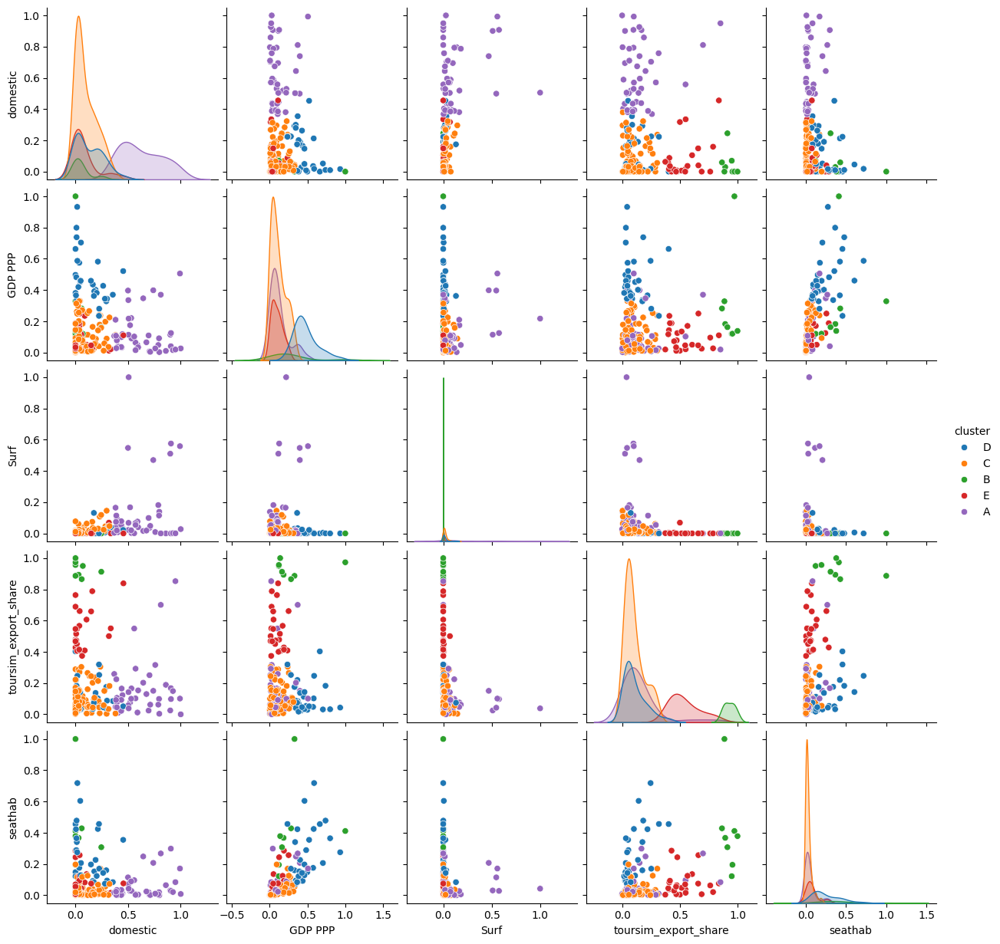

In [71]:

sns.pairplot(data_clustering, hue='cluster')
plt.show()



C:\Users\a.salgas.ISAE-SUPAERO\AppData\Local\miniconda3\envs\aeroscope\lib\site-packages\numpy\core\fromnumeric.py:3462: FutureWarning:

In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'

C:\Users\a.salgas.ISAE-SUPAERO\AppData\Local\miniconda3\envs\aeroscope\lib\site-packages\numpy\core\fromnumeric.py:3462: FutureWarning:

In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'

C:\Users\a.salgas.ISAE-SUPAERO\AppData\Local\miniconda3\envs\aeroscope\lib\site-packages\numpy\core\fromnumeric.py:3462: FutureWarning:

In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'

C:\Users\a.salgas.ISAE-SUPAERO\AppData\Local\miniconda3\en

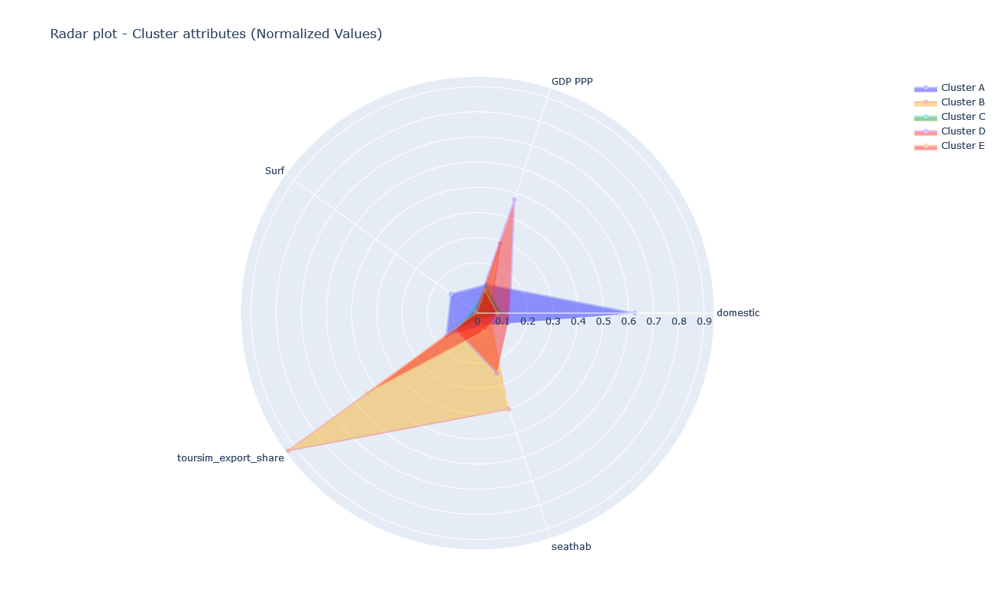

In [72]:
#cluster characteristics with a radarplot
import plotly.graph_objects as go

attributes = data_clustering.columns[:5]

fig = go.Figure()

fig.add_trace(go.Scatterpolar(r=np.mean(data_clustering.loc[data_clustering.cluster == 'A', attributes]),
                              theta=attributes,
                              fill='toself',
                              fillcolor='blue',
                              opacity=0.4,
                              name='Cluster A'))
fig.add_trace(go.Scatterpolar(r=np.mean(data_clustering.loc[data_clustering.cluster == 'B', attributes]),
                              theta=attributes,
                              fill='toself',
                              fillcolor='orange',
                              opacity=0.4,
                              name='Cluster B'))
fig.add_trace(go.Scatterpolar(r=np.mean(data_clustering.loc[data_clustering.cluster == 'C', attributes]),
                              theta=attributes,
                              fill='toself',
                              fillcolor='green',
                              opacity=0.4,
                              name='Cluster C'))
fig.add_trace(go.Scatterpolar(r=np.mean(data_clustering.loc[data_clustering.cluster == 'D', attributes]),
                              theta=attributes,
                              fill='toself',
                              fillcolor='red',
                              opacity=0.4,
                              name='Cluster D'))
fig.add_trace(go.Scatterpolar(r=np.mean(data_clustering.loc[data_clustering.cluster == 'E', attributes]),
                              theta=attributes,
                              fill='toself',
                              fillcolor='red',
                              opacity=0.4,
                              name='Cluster E'))

fig.update_layout(polar=dict(radialaxis=dict(visible=True)),showlegend=True,
                  title="Radar plot - Cluster attributes (Normalized Values)", height=800)
fig.show()

In [73]:
### Try with more clusters ==> Not conclusive.

In [74]:
import geopandas as gpd
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Join the data frame with the shapefile
gdf = world.merge(data_clustering, left_on='iso_a3', right_on='country_iso')
gdf.head()

,pop_est,continent,name,iso_a3,gdp_md_est,geometry,domestic,GDP PPP,Surf,toursim_export_share,seathab,country,country_iso,cluster
0,889953.0,Oceania,Fiji,FJI,5496,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000...",0.558219,0.102477,0.001114,0.549196,0.096219,FJ,FJI,A
1,58005463.0,Africa,Tanzania,TZA,63177,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982...",0.570964,0.015136,0.054087,0.292315,0.002427,TZ,TZA,A
2,37589262.0,North America,Canada,CAN,1736425,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742...",0.499191,0.396764,0.547454,0.042355,0.114377,CA,CAN,A
3,328239523.0,North America,United States of America,USA,21433226,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000...",0.992591,0.505753,0.558557,0.100882,0.170940,US,USA,A
4,18513930.0,Asia,Kazakhstan,KAZ,181665,"POLYGON ((87.35997 49.21498, 86.59878 48.54918...",0.380764,0.209859,0.164847,0.047326,0.026238,KZ,KAZ,A


In [75]:
fig = px.choropleth_mapbox(
    gdf,
    geojson=gdf.geometry,
    locations=gdf.index,
    color='cluster',
    mapbox_style="carto-positron",
    height=800
)

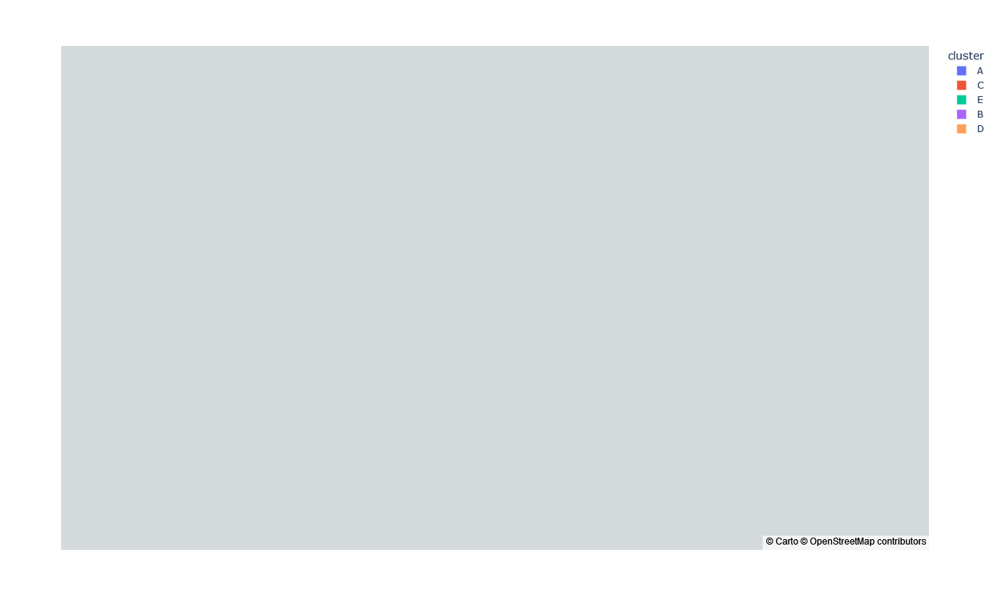

In [76]:
fig

In [77]:
data_clustering

,domestic,GDP PPP,Surf,toursim_export_share,seathab,country,country_iso,cluster
0,0.212720,0.581956,0.004335,0.101918,0.424204,AE,ARE,D
1,0.081691,0.011059,0.039825,0.059985,0.001116,AF,AFG,C
2,0.029380,0.182698,0.000026,0.893380,0.367247,AG,ATG,B
4,0.016540,0.105851,0.001672,0.548702,0.036952,AL,ALB,E
5,0.000000,0.111292,0.001737,0.288317,0.034200,AM,ARM,C
...,...,...,...,...,...,...,...,...
224,0.392867,0.077993,0.019137,0.044954,0.033726,VN,VNM,A
225,0.949614,0.019171,0.000743,0.852291,0.083774,VU,VUT,A
227,0.148858,0.046002,0.000169,0.658875,0.074611,WS,WSM,E
231,0.384979,0.107480,0.074072,0.091704,0.022622,ZA,ZAF,A


In [78]:
country_flows_clust=country_flows.merge(data_clustering, left_on='departure_country', right_on='country', how='left').rename(columns={'cluster':'departure_cluster'})
country_flows_clust=country_flows_clust.merge(data_clustering, left_on='arrival_country', right_on='country', how='left').rename(columns={'cluster':'arrival_cluster'})


In [79]:
country_flows_clust

,departure_country,arrival_country,departure_country_name,arrival_country_name,departure_ISO3,arrival_ISO3,seats,ask,fuel_burn,co2,CO2 (Mt),ASK (Bn),Seats (Mn),departure_lat,departure_lon,arrival_lat,arrival_lon,color,domestic_x,GDP PPP_x,Surf_x,toursim_export_share_x,seathab_x,country_x,country_iso_x,departure_cluster,domestic_y,GDP PPP_y,Surf_y,toursim_export_share_y,seathab_y,country_y,country_iso_y,arrival_cluster
0,AE,AE,United Arab Emirates,United Arab Emirates,ARE,ARE,3.773469e+06,2.292462e+06,7.107818e+05,2.246071e+06,0.002246,0.002292,3.773469,24.0,54.0,24.0,54.0,#7D00FF,0.212720,0.581956,0.004335,0.101918,0.424204,AE,ARE,D,0.212720,0.581956,0.004335,0.101918,0.424204,AE,ARE,D
1,AE,AF,United Arab Emirates,"Afghanistan, Islamic Republic of",ARE,AFG,4.824492e+05,8.111237e+08,1.943289e+07,6.140795e+07,0.061408,0.811124,0.482449,24.0,54.0,33.0,65.0,#7D00FF,0.212720,0.581956,0.004335,0.101918,0.424204,AE,ARE,D,0.081691,0.011059,0.039825,0.059985,0.001116,AF,AFG,C
2,AE,AL,United Arab Emirates,"Albania, Republic of",ARE,ALB,2.630364e+02,9.863667e+05,1.981434e+04,6.261332e+04,0.000063,0.000986,0.000263,24.0,54.0,41.0,20.0,#7D00FF,0.212720,0.581956,0.004335,0.101918,0.424204,AE,ARE,D,0.016540,0.105851,0.001672,0.548702,0.036952,AL,ALB,E
3,AE,AM,United Arab Emirates,"Armenia, Republic of",ARE,ARM,1.290026e+05,2.506020e+08,5.173337e+06,1.634774e+07,0.016348,0.250602,0.129003,24.0,54.0,40.0,45.0,#7D00FF,0.212720,0.581956,0.004335,0.101918,0.424204,AE,ARE,D,0.000000,0.111292,0.001737,0.288317,0.034200,AM,ARM,C
4,AE,AO,United Arab Emirates,"Angola, Republic of",ARE,AGO,1.172423e+05,6.944986e+08,1.634034e+07,5.163546e+07,0.051635,0.694499,0.117242,24.0,54.0,-12.5,18.5,#7D00FF,0.212720,0.581956,0.004335,0.101918,0.424204,AE,ARE,D,0.588891,0.048101,0.076125,0.011666,0.001839,AO,AGO,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7519,ZW,RW,"Zimbabwe, Republic of","Rwanda, Republic of",ZWE,RWA,2.529389e+04,4.474041e+07,1.062685e+06,3.358084e+06,0.003358,0.044740,0.025294,-20.0,30.0,-2.0,30.0,#FF7D7D,0.267945,0.012071,0.023621,0.057867,0.003133,ZW,ZWE,C,0.055822,0.011972,0.001505,0.303422,0.003907,RW,RWA,C
7520,ZW,TZ,"Zimbabwe, Republic of","Tanzania, United Republic of",ZWE,TZA,2.295190e+04,3.458205e+07,8.460097e+05,2.673391e+06,0.002673,0.034582,0.022952,-20.0,30.0,-6.0,35.0,#FF7D7D,0.267945,0.012071,0.023621,0.057867,0.003133,ZW,ZWE,C,0.570964,0.015136,0.054087,0.292315,0.002427,TZ,TZA,A
7521,ZW,ZA,"Zimbabwe, Republic of","South Africa, Republic of",ZWE,ZAF,6.464164e+05,6.411850e+08,1.757866e+07,5.554856e+07,0.055549,0.641185,0.646416,-20.0,30.0,-29.0,24.0,#FF7D7D,0.267945,0.012071,0.023621,0.057867,0.003133,ZW,ZWE,C,0.384979,0.107480,0.074072,0.091704,0.022622,ZA,ZAF,A
7522,ZW,ZM,"Zimbabwe, Republic of","Zambia, Republic of",ZWE,ZMB,1.290411e+05,5.149301e+07,2.127921e+06,6.724231e+06,0.006724,0.051493,0.129041,-20.0,30.0,-15.0,30.0,#FF7D7D,0.267945,0.012071,0.023621,0.057867,0.003133,ZW,ZWE,C,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [80]:
hoss=country_flows_clust.groupby(['departure_cluster','arrival_cluster'])['seats'].sum().reset_index()

In [81]:
hoss.rename(columns={'departure_cluster':'source','arrival_cluster':'target','seats':'weight'},inplace=True)
hoss

,source,target,weight
0,A,A,2.918871e+09
1,A,B,9.229433e+06
2,A,C,1.277377e+08
3,A,D,2.458874e+08
4,A,E,1.775884e+07
5,B,A,9.229433e+06
6,B,B,1.435773e+06
7,B,C,1.529478e+06
8,B,D,2.611412e+06
9,B,E,4.538276e+05


In [82]:
from d3blocks import D3Blocks
d3=D3Blocks()

d3.chord(hoss)

[d3blocks] >INFO> Cleaning edge_properties and config parameters..
[d3blocks] >INFO> Cleaning edge_properties and config parameters..
[d3blocks] >INFO> Initializing [Chord]
[d3blocks] >INFO> filepath is set to [C:\Users\ASALGA~1.ISA\AppData\Local\Temp\d3blocks\chord.html]
[d3blocks] >INFO> Convert to DataFrame.
[d3blocks] >INFO> Node properties are set.
[d3blocks] >INFO> Set edge-opacity based on the [source] node-opacity.
[d3blocks] >INFO> Set edge-colors based on the [source] node-color.
[d3blocks] >INFO> Edge properties are set.
[d3blocks] >INFO> File already exists and will be overwritten: [C:\Users\ASALGA~1.ISA\AppData\Local\Temp\d3blocks\chord.html]
[d3blocks] >INFO> Open browser: C:\Users\ASALGA~1.ISA\AppData\Local\Temp\d3blocks\chord.html


In [53]:
# tested insularity and biggest airport (hub proxy) ==> Not relevant

In [ ]:
# ranked_airports = flights_df[(flights_df.distance_km>5000) & (flights_df.seats>100000)].groupby(['iata_departure','departure_country'])['iata_arrival'].count().sort_values(ascending=False).reset_index(name='destination_count').reset_index()

# first_airport_rank = ranked_airports.groupby('departure_country').head(1).reset_index(drop=True)

In [ ]:
# country_rank_df = first_airport_rank[['departure_country', 'index']].reset_index(drop=True)
# country_rank_df.columns = ['country_code', 'airport_rank']

In [ ]:
# df=df.merge(country_rank_df, left_on='departure_country', right_on='country_code', how='left')

In [ ]:
# country_rank_df